In [1]:
### Cell Type Annotation
# 'here there be dragons'
# Cell Type Annotation is the process of adding cell types to clusters to turn findings about groups of unknown cells
# into biological insights. Note: this is not the only kind of annotation you can do, you can annotate based
# on sex, disease, batch, etc, but this is likely to be the most universal of annotations conducted in 
# scRNA-seq analysis.
# suffice to say, this process can be challenging to do and this notebook will cover 2 major methods of 
# cell type annotation: manual and automated

In [2]:
# env setup: here I am suppressing warnings that are not relevant to the analysis we want to conduct
import warnings

warnings.filterwarnings("ignore", category=DeprecationWarning)

import numba
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning

warnings.simplefilter("ignore", category=NumbaDeprecationWarning)


In [3]:
pip install celltypist scarches

Note: you may need to restart the kernel to use updated packages.


In [4]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scarches as sca
import urllib.request

In order to use the mouse gastrulation seqFISH datsets, please install squidpy (see https://github.com/scverse/squidpy).
In order to use sagenet models, please install pytorch geometric (see https://pytorch-geometric.readthedocs.io) and 
 captum (see https://github.com/pytorch/captum).
mvTCR is not installed. To use mvTCR models, please install it first using "pip install mvtcr"
multigrate is not installed. To use multigrate models, please install it first using "pip install multigrate".


In [5]:
# filter pandas performance warnings 
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [6]:
sc.set_figure_params(figsize=(5, 5))
adata = sc.read(filename="s4d8_clustered.h5ad")

In [7]:
### Manual Annotation
# considered the classical method of cell type annotation, here, using a selection of marker genes,
# we will look for clusters that express marker genes for one cell type and call that cluster by the cell
# type who's markers it expresses.
# This is a great method when clear markers of cell identity exist, but when there is no single marker 
# of cell identity this gets messy fast, because suddely the process becomes very subjective
# Clusetring before annotaion helps in two major ways: 1) we can label a whole cluster
# rather than having to individually label each cell. 2) looking at a clusters expression profile rather 
#than a single cell's expression profile makes the label more robust to expression noise

In [8]:
### Annotation from markers
# this approach uses known markers of cells to assign cell types. Start by listing a set of markers
# for cell types (based on the fact that this is a bone marrow data set, we can be pretty specific
# about the gene expressions we check for )
# note: because transcription is not translation, you should focus on using markers from RNA-based 
# papers rather than protein based papers
# 

In [9]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [10]:
# no need to check for markers if they don't exist, so remove markers that aren't in our adata object
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [11]:
# we can use a 2d projection to visualize the marker expressions (color a UMAP based on expression)
# so we construct a UMAP, using scran normalized counts, for highly divergrent genes

In [12]:
adata.layers["counts"] = adata.X # save counts to a layer in case we need them later
adata.X = adata.layers["scran_normalization"] # then set X to our normalized data

In [13]:
# because scanpy defaults to using .var['highly_variable'], we need to set this to the 
# deviant genes
adata.var["highly_variable"] = adata.var["highly_deviant"]

In [14]:
# perform the PCA using our dviant genes. Use the deviant genes to focus the PCA on the genes that
# are most likely to be 'interesting' in further analysis
sc.tl.pca(adata, n_comps=50, use_highly_variable=True)

In [15]:
sc.pp.neighbors(adata) # generate neighbor graph based on PCs

In [16]:
sc.tl.umap(adata) # use the neighbor graph to generate a 2D UMAP for the data

In [17]:
# now onto using our markers to color UMAPs to identify cell types
# first B/plasma cell subtypes. First list the B cell subtypes of interest 
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


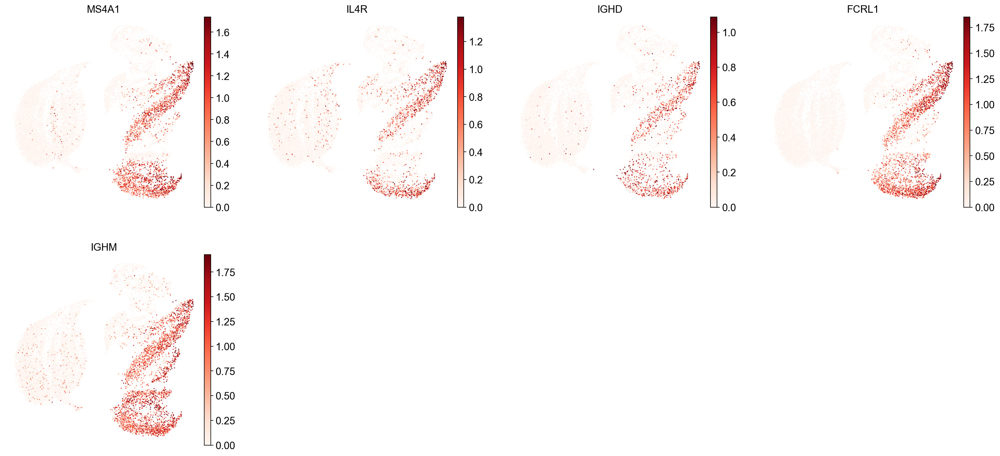





B1 B:


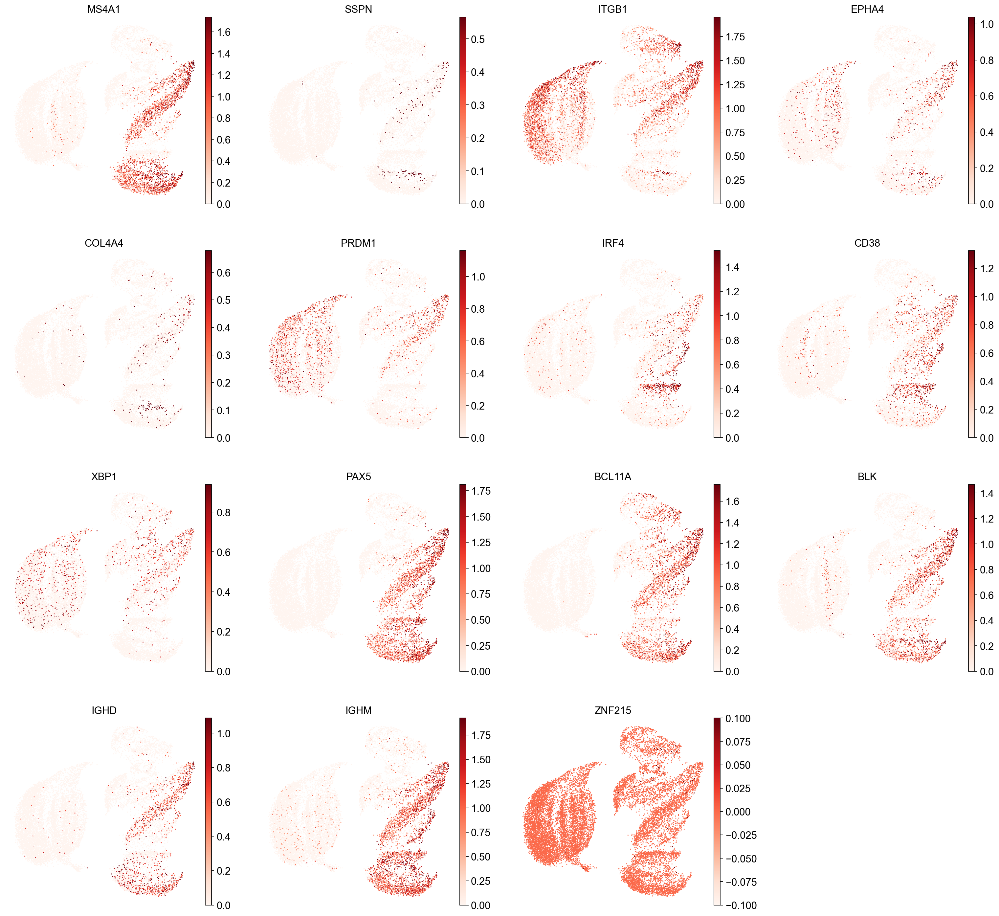





TRANSITIONAL B:


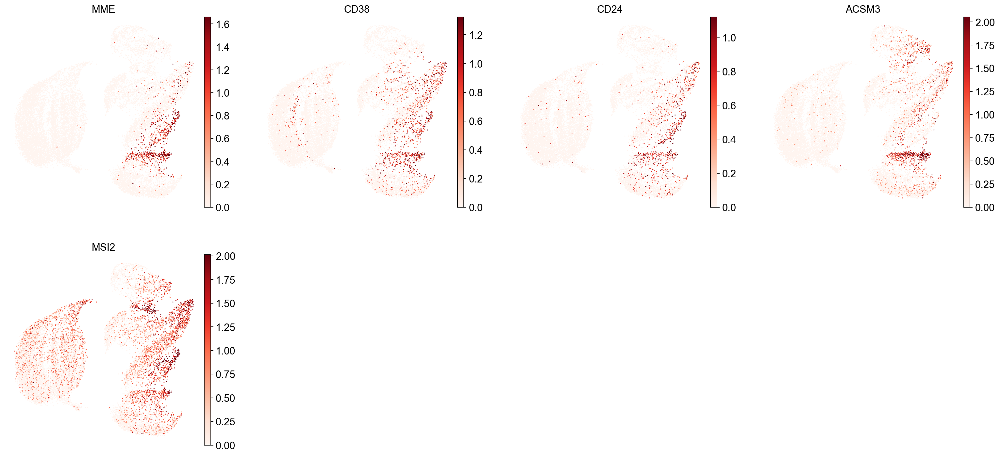





PLASMA CELLS:


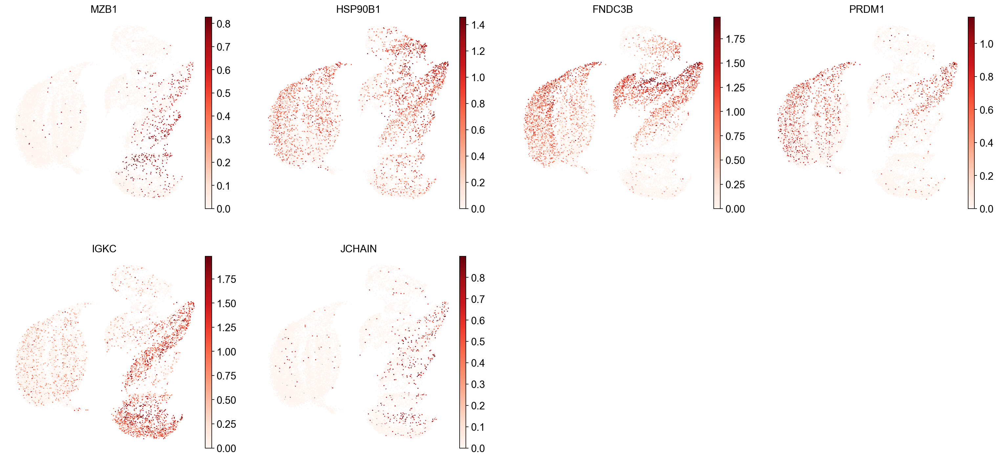





PLASMABLAST:


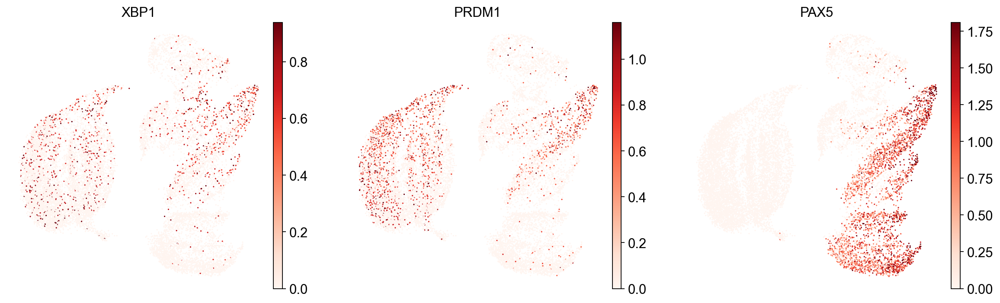

In [18]:
# now, we plot one UMAP per marker for each of the B cell subtypes
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [19]:
# from the plots above it should be clear that markers, even those for a single cell type, are often
# expressed in different sets of the data (individual markers are often not uniquely expressed)
# instead we must look for intersections of subsets to determine where the cell type of interest is

# Another major point: marker cells are often sparsely expressed. it is often only a subset of cells
# of a given type that amarker was detected in. This is an inherit aspect of the nature of scRNA-seq
# because only a subset of the total RNA in a cell is sequenced, meaning that we will not always 
# sample transcripts from specific genes in a cell even if they were expressed there. This is why
# sc data is not, or should not be, annotated based on minimum expression threshold. 
# Instead we partition the data into groups of similar cells by clustering, so we can account for 
# missing transcripts by grouping based on overal stranscriptomic similarity

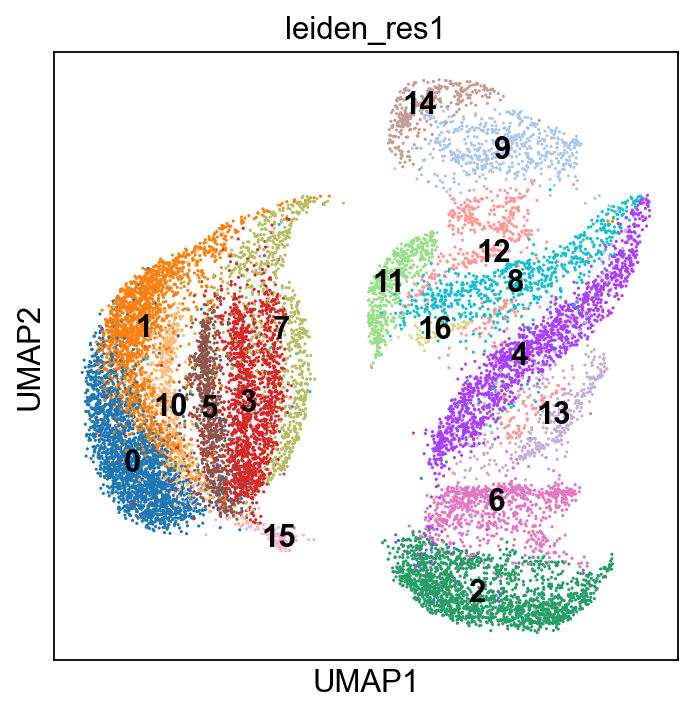

In [29]:
# if you have been following along with the notebooks, then we have prviously clustered the data
# we can now use those clusterings to color the above umap
sc.pl.umap(adata, color='leiden_res1', legend_loc="on data")

In [21]:
# this is a relatively coarse clustering map, so we could up the resolution of the leiden alg
# to see if we can better match the umap to the cell annotations 
sc.tl.leiden(adata, resolution=2, key_added='leiden_2')

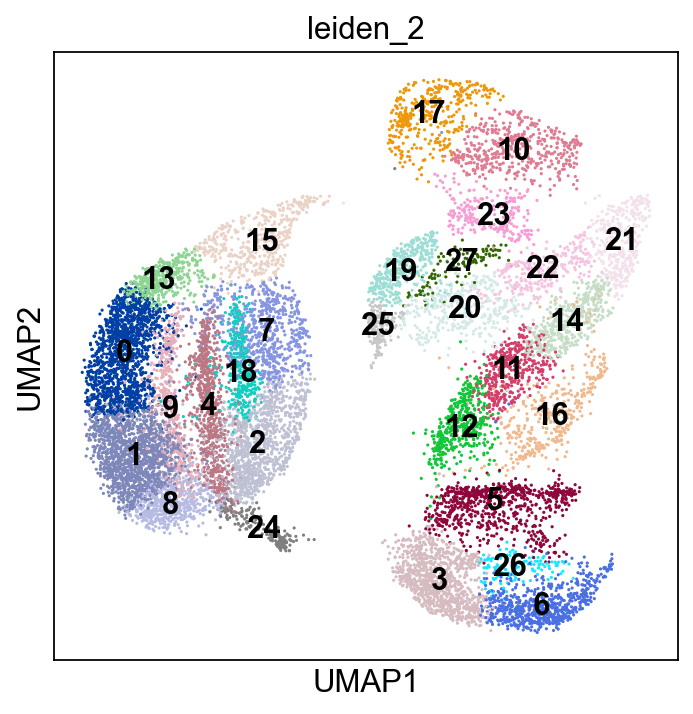

In [30]:
sc.pl.umap(adata, color='leiden_2', legend_loc="on data")

In [23]:
# ... ok probably too fine
sc.tl.leiden(adata, resolution=1.5, key_added='leiden_1.5')

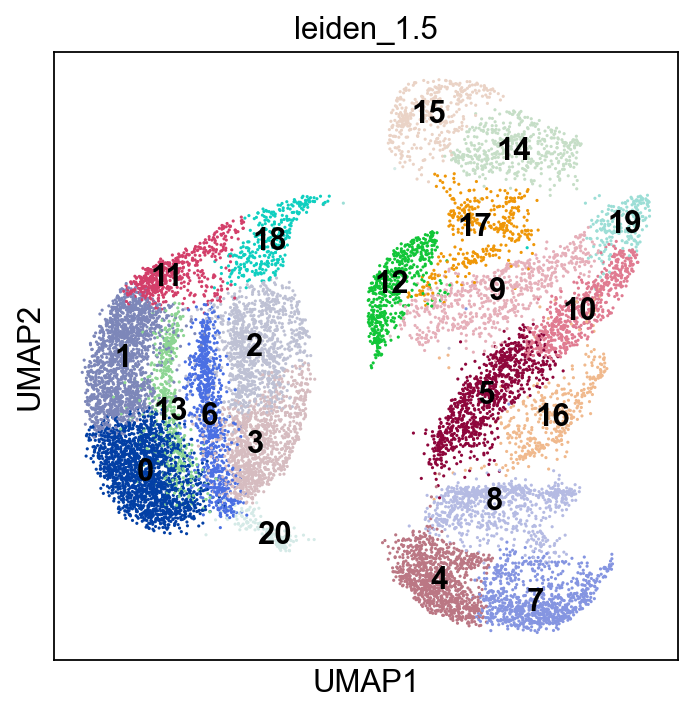

In [34]:
sc.pl.umap(adata, color='leiden_1.5',legend_loc="on data")

In [25]:
# something to note, it can be very challenging to line up the dots between leiden clusters and 
# marker expression maps, so we can plot these values against each other
B_plasma_markers = {ct: [m for m in ct_markers if m in adata.var.index] 
                    for ct, ct_markers in marker_genes.items()
                    if ct in B_plasma_cts
                   }

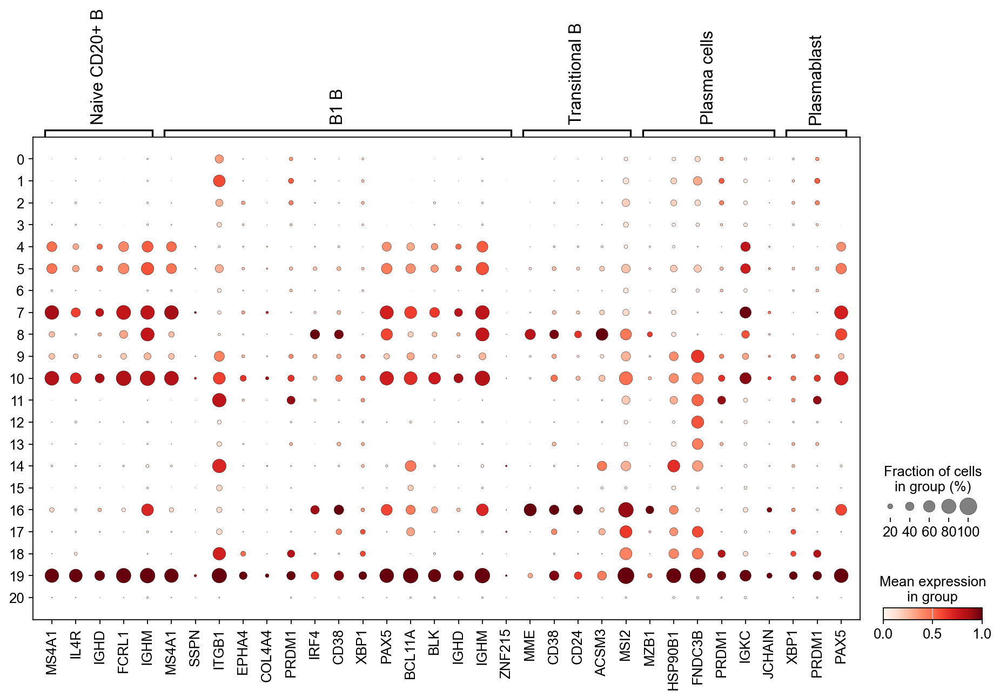

In [26]:
# standard scale normalizes each gene to range from 0-1
sc.pl.dotplot(
    adata, 
    groupby='leiden_1.5', 
    var_names=B_plasma_markers, 
    standard_scale="var" 
)
    

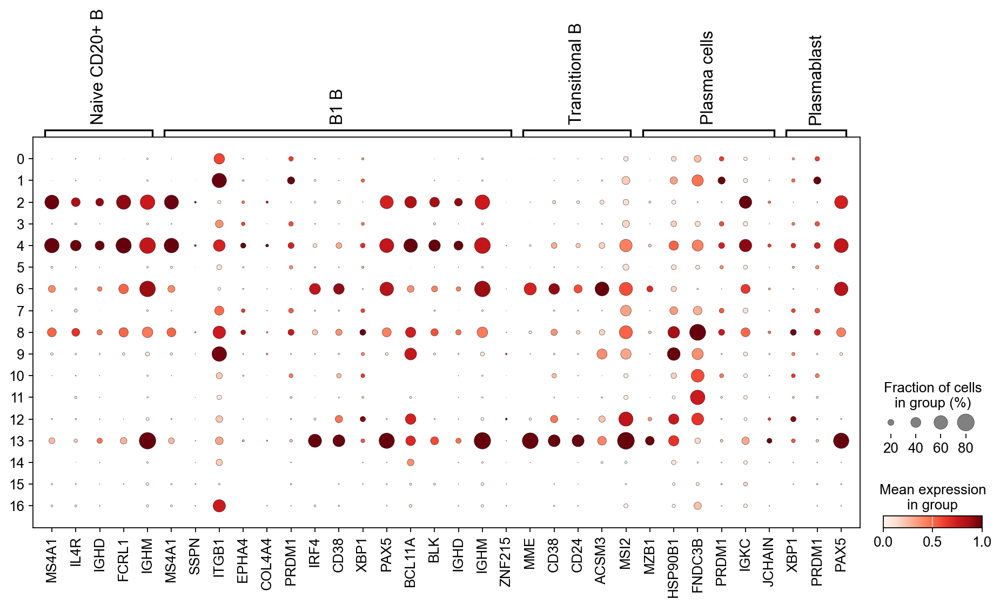

In [28]:
# maybe too many clusters, let's try with a lower resolution to see if the picture gets clearer
# standard scale normalizes each gene to range from 0-1
sc.pl.dotplot(
    adata, 
    groupby='leiden_res1', 
    var_names=B_plasma_markers, 
    standard_scale="var" 
)

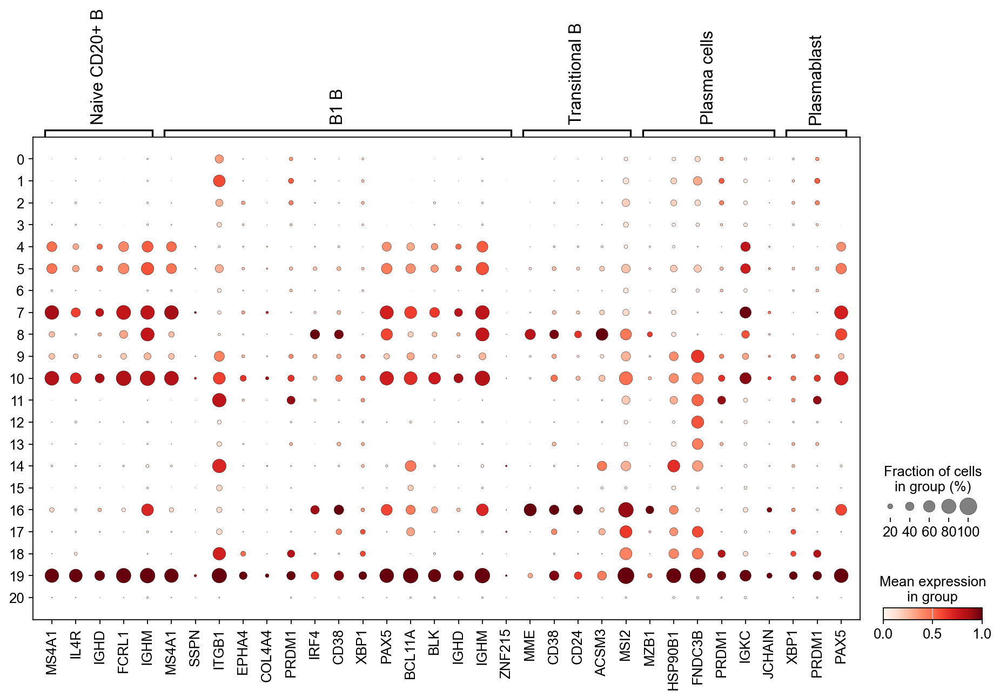

In [32]:
# No cluster here corresponds nicely to the B1 B cells (all clusters are either lowly expressing, 
# or expressing negative markers) so our original clustering is probable more appropriate 
sc.pl.dotplot(
    adata, 
    groupby='leiden_1.5', 
    var_names=B_plasma_markers, 
    standard_scale="var" 
)

In [36]:
# now using the dot plot and the UMAPS, we can start assigning clusters
cl_annotation = {
    "7": "Naive CD20+ B",
    "10": "Naive CD20+ B",
    "8": "Transitional B",
    "16": "Transitional B",
    "9": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
    "18":"Plasma cells",
}
#Note: plasmablasts are almost impossible to pin to a single cluster, so they have been left out
# (this is part of the judgement call nature of sc annotations) You may also note that B1 B cells are
# a pretty tricky group to place, both of these findings are indicative that markers that work
# well for one dataset do not always work well for others. This can be due to seq depth, or other 
# variations between datasets/samples

... storing 'manual_celltype_annotation' as categorical


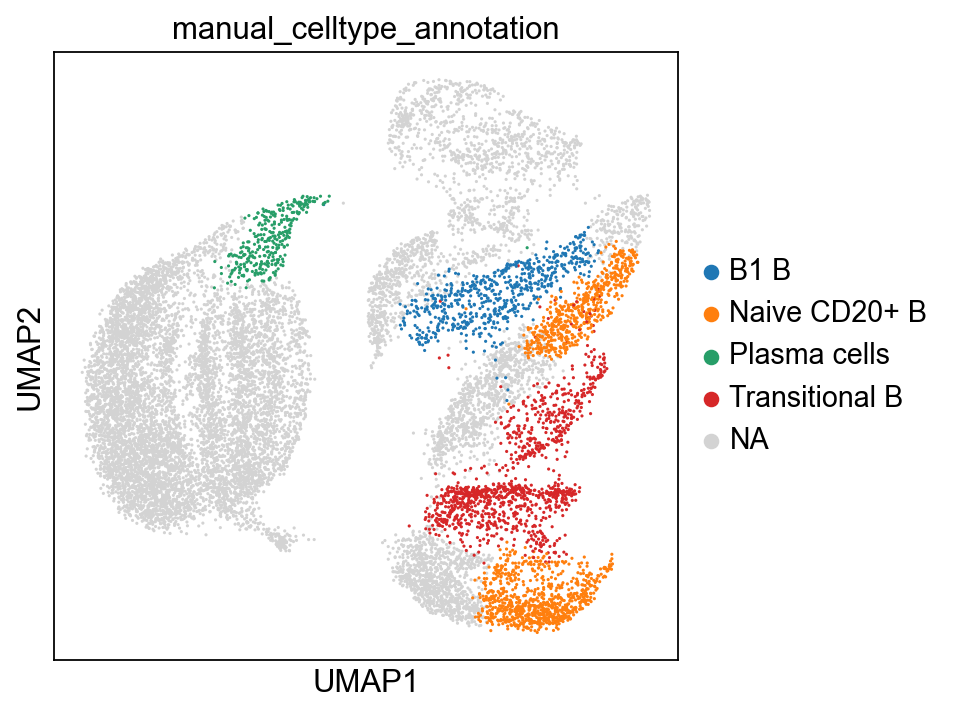

In [38]:
# add our observatoins to the adata object, then visualize
adata.obs["manual_celltype_annotation"] = adata.obs["leiden_1.5"].map(cl_annotation)
sc.pl.umap(adata, color=["manual_celltype_annotation"])